# Setup

In [1]:
%matplotlib inline
import os, sys, glob, shutil
from matplotlib import pyplot as plt
import numpy as np
import torch
import h5py
sys.path.append('../utils/')
import functions_for_fred as fn
import nn
import viz
import pred

In [2]:
print('we are here {}'.format(os.getcwd()))

we are here /gpfs/slac/cryo/fs1/g/ML/vaegan/analysis


The dataset used for training is found in `DATASET_DIR`: the files `TRAIN_DATASET_PATH` and `TRAIN_METADATASET_PATH` contain the data and metadata respectively. The trained network is stored in `TRAINED_DIR` where checkpoints are stored and named according to the rule `KEYWORD_NINA+_+TRAINED_CHECKPOINT`. For our analysis, we define a local `KEYWORD` directory where we copy the checkpoint of interest.

Keywords and epoch numbers can be changed in the next cell, while the following cell can be ran without editing.

In [3]:
KEYWORD      = 'sim_2Dclass_nodisorder_nonoise_128x128'
KEYWORD_NINA = 'cryo_sim'
EPOCH_NUMBER = 295

In [4]:
DATASET_DIR = '../datasets/sim/randomrot1D_nodisorder_nonoise_128x128/'
TRAINED_DIR = '../train_vae/'
TRAIN_DATASET_PATH     = DATASET_DIR+'cryo_sim_128x128.npy'
TRAIN_METADATASET_PATH = DATASET_DIR+'cryo_sim_labels_128x128.csv'
TRAINED_CHECKPOINT     = 'epoch_'+str(EPOCH_NUMBER)+'_checkpoint.pth'
if not os.path.exists(KEYWORD):
    os.makedirs(KEYWORD)
if not os.path.exists(KEYWORD+'/train_vae'):
    os.makedirs(KEYWORD+'/train_vae')
if not os.path.isfile(KEYWORD+'/train_vae/'+TRAINED_CHECKPOINT):
    shutil.copyfile(TRAINED_DIR+KEYWORD_NINA+'_'+TRAINED_CHECKPOINT, KEYWORD+'/train_vae/'+TRAINED_CHECKPOINT)

# Load dataset, encoder and decoder

In [5]:
dataset = np.load(TRAIN_DATASET_PATH)
metadata = np.genfromtxt(TRAIN_METADATASET_PATH, delimiter=",", skip_header=1)
print('dataset.shape {} metadata.shape {}'.format(dataset.shape, metadata.shape))

dataset.shape (2544, 1, 128, 128) metadata.shape (2544, 2)


In [6]:
mus = []
mus = fn.latent_projection_old(KEYWORD, TRAIN_DATASET_PATH, epoch_id=EPOCH_NUMBER)
mus.shape

Loading encoder...
sim_2Dclass_nodisorder_nonoise_128x128/train_vae/epoch_295_checkpoint.pth
Found checkpoint. Getting: sim_2Dclass_nodisorder_nonoise_128x128/train_vae/epoch_295_checkpoint.pth.


(2544, 3)

In [8]:
recon = []
recon = fn.reconstruction_old(KEYWORD, torch.Tensor(mus[0:500,...]).cuda(), epoch_id=EPOCH_NUMBER)
recon.shape

Loading decoder...
sim_2Dclass_nodisorder_nonoise_128x128/train_vae/epoch_295_checkpoint.pth
Found checkpoint. Getting: sim_2Dclass_nodisorder_nonoise_128x128/train_vae/epoch_295_checkpoint.pth.


(500, 1, 128, 128)

# Visualize

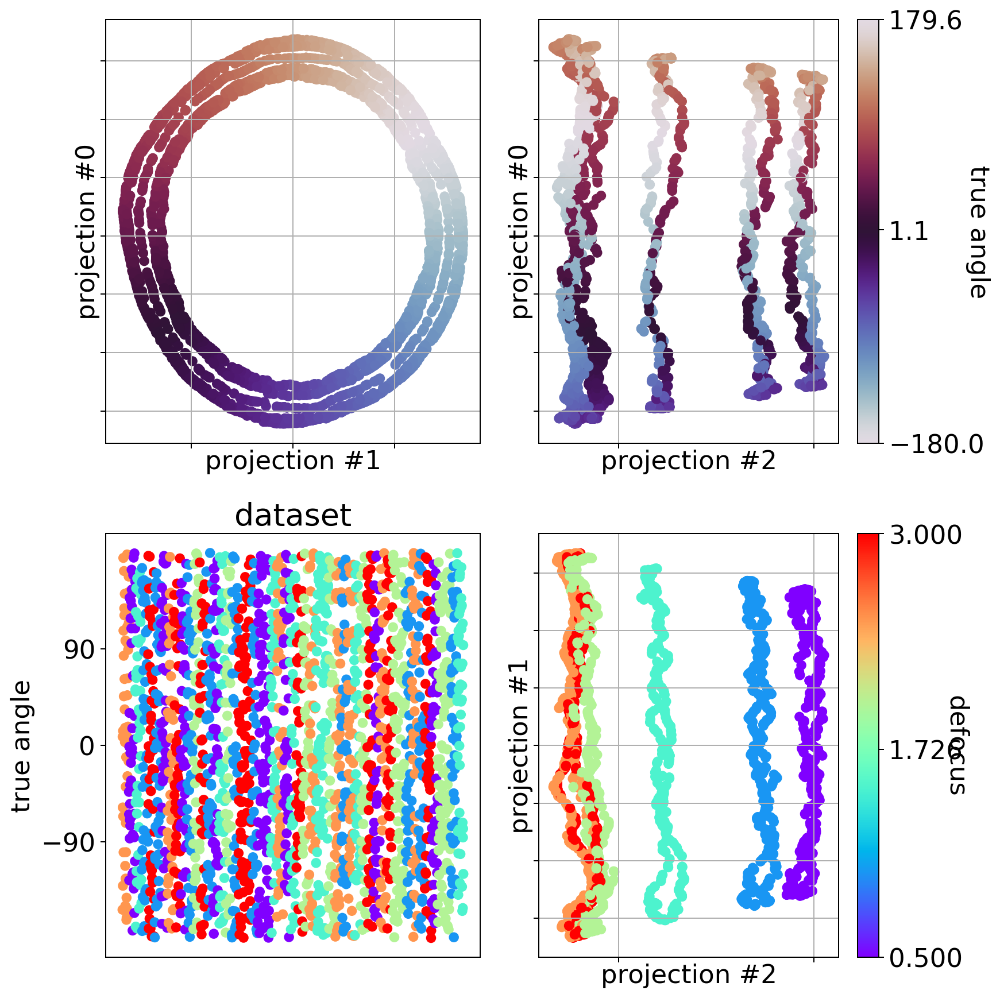

In [9]:
viz.show_latentspace(mus, metadata, 
                     label0='defocus', label1='true angle', 
                     figsize=10, dpi=180, fontsize=18,
                     figname=KEYWORD+'/latent_space.png')

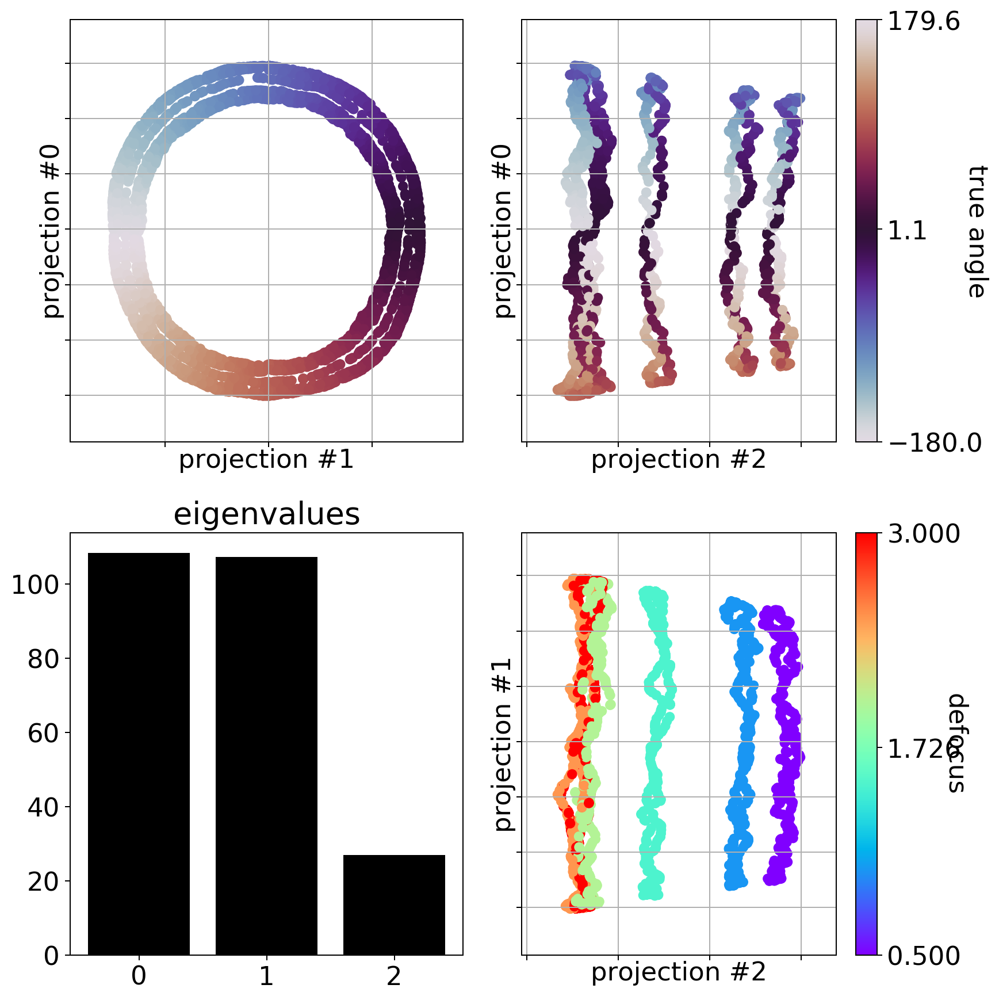

In [10]:
viz.show_latentspace(mus, metadata, 
                     label0='defocus', label1='true angle', 
                     figsize=10, dpi=180, fontsize=18,
                     do_pca=True,
                     figname=KEYWORD+'/pca_of_latent_space.png')

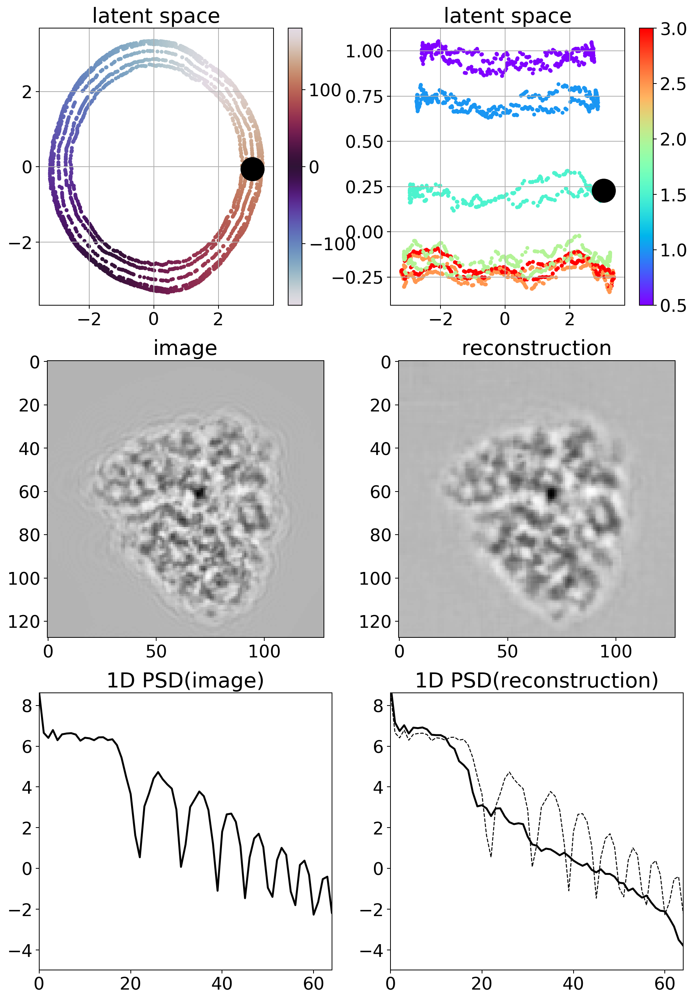

In [11]:
viz.visualize(dataset, recon,
              mus[:,0:2], mus[:,0:3:2],
              metadata[:,1], metadata[:,0],
              iframe=100,
              cmap1='twilight', cmap2='rainbow',
              show_3dpsd=False, show_1dpsd=True)

# Correlation between features and ground truth

In [12]:
angle_true   = metadata[:,1] + 180
defocus_true = metadata[:,0]

In [15]:
U, L, Vt = np.linalg.svd(mus)

In [16]:
angle_pred, defocus_pred = pred.pred2d(U, angle_true, defocus_true, 
                                       angle_pred_sign=1.0,
                                       defocus_min=0.5,defocus_max=2.5,
                                       do_ellipse=True)

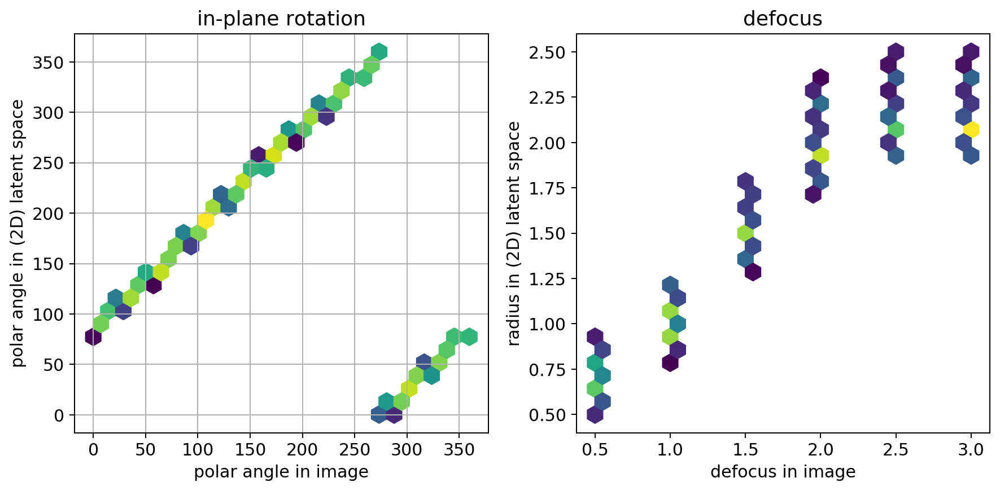

In [18]:
viz.plot_pred2d(angle_pred, defocus_pred, 
                angle_true, defocus_true, 
                figname=KEYWORD+'/polar_prediction_ellipse')

offset: -85.0 angle RMSE = 1.6919987443808526
offset: -84.75 angle RMSE = 1.6676439164600378
offset: -84.5 angle RMSE = 1.6805394113872978
offset: -84.25 angle RMSE = 1.729852362008318
defocus RMSE = 0.41446570524372855


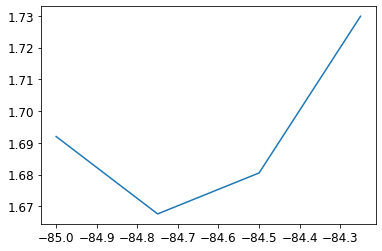

In [26]:
offset_range = np.arange(-85,-84,0.25)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true, defocus_true, 
                                                angle_offset_range=offset_range)
plt.plot(offset_range,angle_RMSE_list)

In [38]:
# remove defocus 3.0

In [46]:
mus2          = mus[np.where(defocus_true<3),:][0,...]
angle_true2   = angle_true[np.where(defocus_true<3)]
defocus_true2 = defocus_true[np.where(defocus_true<3)]

In [47]:
U2, L2, Vt2 = np.linalg.svd(mus2)

In [48]:
angle_pred, defocus_pred = pred.pred2d(U2, angle_true2, defocus_true2, 
                                       angle_pred_sign=1.0,
                                       defocus_min=0.5,defocus_max=2.5,
                                       do_ellipse=True)

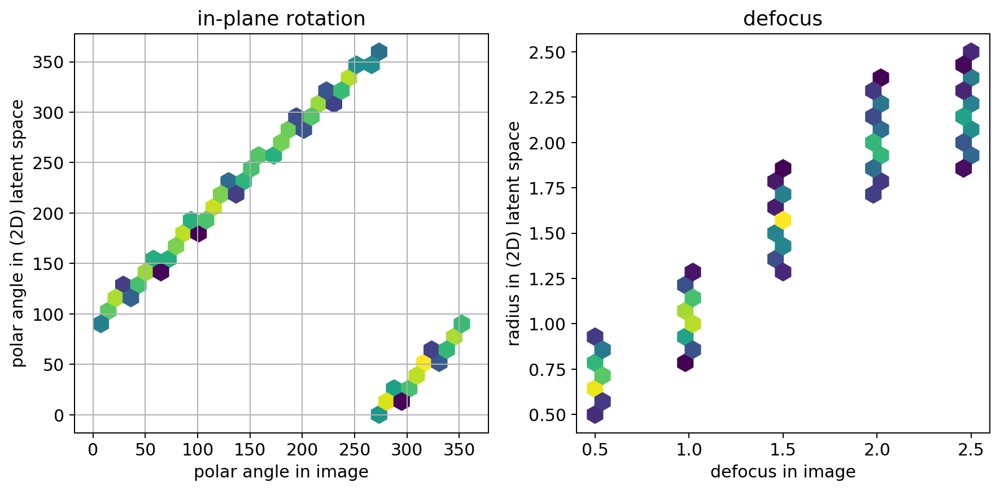

In [49]:
viz.plot_pred2d(angle_pred, defocus_pred, 
                angle_true2, defocus_true2, 
                figname=KEYWORD+'/polar_prediction_ellipse_nodefocus3')

offset: -90.25 angle RMSE = 1.710232914139683
offset: -90.2 angle RMSE = 1.7027634702875338
offset: -90.15 angle RMSE = 1.6967332806427806
offset: -90.10000000000001 angle RMSE = 1.6921607418510993
offset: -90.05000000000001 angle RMSE = 1.6890554624595047
offset: -90.00000000000001 angle RMSE = 1.687428672535191
offset: -89.95000000000002 angle RMSE = 1.687282693830516
offset: -89.90000000000002 angle RMSE = 1.688616129463311
offset: -89.85000000000002 angle RMSE = 1.6914269662091848
offset: -89.80000000000003 angle RMSE = 1.6957083241215753
defocus RMSE = 0.22005719315137767


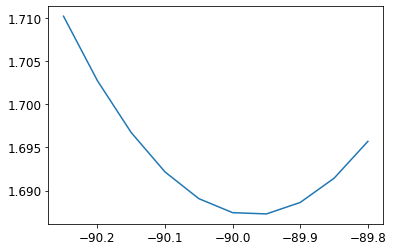

In [51]:
offset_range = np.arange(-90.25, -89.75,0.05)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true2, defocus_true2, 
                                                angle_offset_range=offset_range)
plt.plot(offset_range,angle_RMSE_list)

In [42]:
# circle

In [52]:
angle_pred, defocus_pred = pred.pred2d(U2,  
                                       angle_true2, defocus_true2, 
                                       do_ellipse=False)

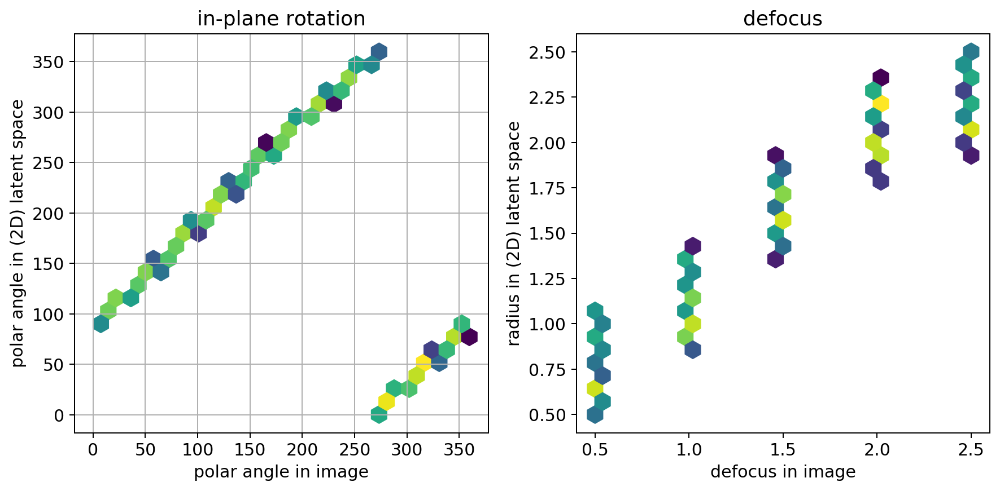

In [53]:
viz.plot_pred2d(angle_pred, defocus_pred, 
                angle_true2, defocus_true2,
                figname=KEYWORD+'/polar_prediction_nodefocus3_circle')

offset: -90.25 angle RMSE = 1.8665230436410252
offset: -90.2 angle RMSE = 1.859650516476628
offset: -90.15 angle RMSE = 1.8541022381255807
offset: -90.10000000000001 angle RMSE = 1.8498849737058927
offset: -90.05000000000001 angle RMSE = 1.84701638273666
offset: -90.00000000000001 angle RMSE = 1.8454976557251042
offset: -89.95000000000002 angle RMSE = 1.8453330031422712
offset: -89.90000000000002 angle RMSE = 1.846523802935596
offset: -89.85000000000002 angle RMSE = 1.8490608460685094
offset: -89.80000000000003 angle RMSE = 1.8529496243297519
defocus RMSE = 0.24663614202501313


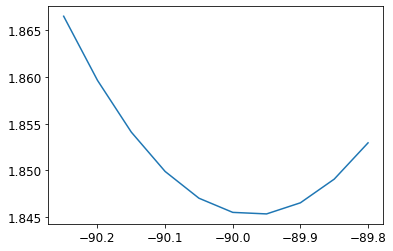

In [54]:
offset_range = np.arange(-90.25, -89.75,0.05)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true2, defocus_true2, 
                                                angle_offset_range=offset_range)
plt.plot(offset_range,angle_RMSE_list)

## Cone fitting (ad-hoc)

In [120]:
from scipy.stats import special_ortho_group
from scipy.optimize import curve_fit

def f(x, A, B): # this is your 'straight line' y=f(x)
    return A*x + B

nsample=10000
ax = np.empty((nsample,3))
ay = np.empty((nsample,3))
az = np.empty((nsample,3))
ax[0,...] = [1,0,0]
ay[0,...] = [0,1,0]
az[0,...] = [0,0,1]
score_list = []

U_original = np.dot(special_ortho_group.rvs(3), U2[:,0:3].T).T

rotmat = np.diag([1,1,1])
U_rotated = np.dot(rotmat,U_original[:,0:3].T).T
dist = pred.rescale_to_zero_one( np.linalg.norm(U_rotated[:,0:2],axis=1))
popt, pcov = curve_fit(f, U_rotated[:,2], dist)
#popt, pcov = curve_fit(f, U_rotated[:,2], np.linalg.norm(U_rotated[:,0:2],axis=1) - np.min(np.linalg.norm(U_rotated[:,0:2],axis=1)))
score = np.abs(popt[0])#np.sum((f(U_curated[:,0], *popt) - np.linalg.norm(U_rotated[:,1:3],axis=1))**2)
#center, axis, theta_0, score= pred.fitEllipse(U_curated)
score_min = score
rotmat_min = rotmat
#center_min = center
ibest = 0
score_list.append(score)
print(ibest,score_min)
#rotmat_min = special_ortho_group.rvs(3)
for i in np.arange(1,nsample):
    rotmat = special_ortho_group.rvs(3)
    ax[i,...] = np.dot(rotmat,ax[0,...])
    ay[i,...] = np.dot(rotmat,ay[0,...])
    az[i,...] = np.dot(rotmat,az[0,...])
    U_rotated = np.dot(rotmat,U_original[:,0:3].T).T
    dist = pred.rescale_to_zero_one( np.linalg.norm(U_rotated[:,0:2],axis=1))
    popt, pcov = curve_fit(f, U_rotated[:,2], dist)
    score = np.abs(popt[0]) #np.sum((f(U_curated[:,0], *popt) - np.linalg.norm(U_rotated[:,1:3],axis=1))**2)
    #center, axis, theta_0, score= pred.fitEllipse(U_curated)
    if(score > score_min):
        score_min = score
        ibest = i
        rotmat_min = rotmat
        #center_min = center
        print(i,score_min)
    score_list.append(score)

0 0.18877495780260883
4 0.496245037202933
7 1.725196785637023
8 2.0850896007182986
10 5.414235566259415
39 6.173853139066632
51 6.174009754515172
81 6.636633228505258
103 13.63593677137488
116 14.64180415873708
1090 14.92234629995176
1331 15.48776020571263


In [123]:
U_best = np.dot(rotmat_min,U_original[:,0:3].T).T#(np.dot(rotmat_min,U_curated[:,0:3].T).T)
print(U_best.shape, U2.shape)

(2112, 3) (2112, 2112)


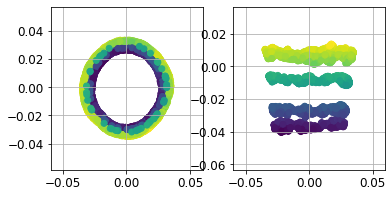

In [124]:
fig = plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plt.scatter(U_best[:,0],U_best[:,1], c=U_best[:,2])
plt.grid()
plt.subplot(1,2,2)
plt.scatter(U_best[:,0],U_best[:,2], c=U_best[:,2])
plt.grid()

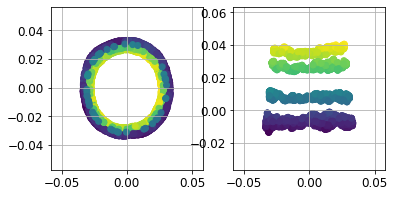

In [125]:
fig = plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plt.scatter(U2[:,0],U2[:,1], c=U2[:,2])
plt.grid()
plt.subplot(1,2,2)
plt.scatter(U2[:,0],U2[:,2], c=U2[:,2])
plt.grid()

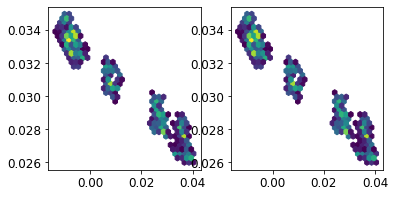

In [119]:
fig = plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plt.hexbin(U_best[:,2],np.linalg.norm(U_best[:,0:2],axis=1), mincnt=1, gridsize=30)
plt.subplot(1,2,2)
plt.hexbin(U2[:,2],np.linalg.norm(U2[:,0:2],axis=1), mincnt=1, gridsize=30)

In [130]:
angle_pred, defocus_pred = pred.pred2d(U_best, angle_true2, defocus_true2, 
                                       angle_pred_sign=-1.0,
                                       defocus_min=0.5,defocus_max=2.5,
                                       do_ellipse=True)

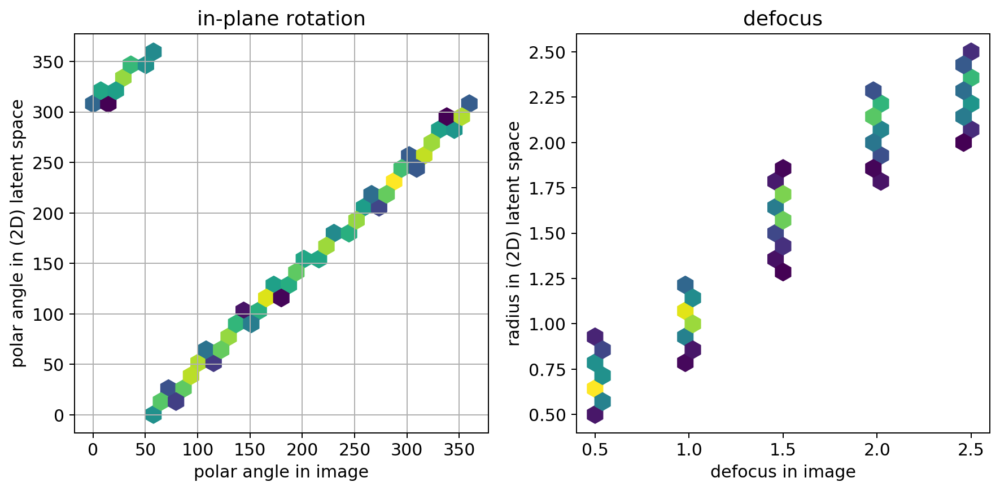

In [131]:
viz.plot_pred2d(angle_pred, defocus_pred, 
                angle_true2, defocus_true2, 
                figname=KEYWORD+'/polar_prediction_cone')

offset: 54.5 angle RMSE = 1.7427253755408387
offset: 54.55 angle RMSE = 1.7355512933377413
offset: 54.599999999999994 angle RMSE = 1.729793296627851
offset: 54.64999999999999 angle RMSE = 1.7254655621921284
offset: 54.69999999999999 angle RMSE = 1.7225788700559825
offset: 54.749999999999986 angle RMSE = 1.7211404709714122
offset: 54.79999999999998 angle RMSE = 1.7211539960352293
offset: 54.84999999999998 angle RMSE = 1.722619411048295
offset: 54.89999999999998 angle RMSE = 1.725533016946568
offset: 54.949999999999974 angle RMSE = 1.7298874962913264
defocus RMSE = 0.17841735888288843


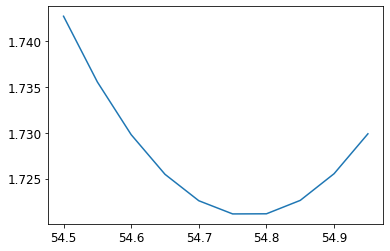

In [137]:
offset_range = np.arange(54.5,55,0.05)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true2, defocus_true2, 
                                                angle_offset_range=offset_range)
plt.plot(offset_range,angle_RMSE_list)

# Explore latent space

## Extract series at constant defocus

In [15]:
SERIES_NAME='defocus2.5'
if not os.path.exists(KEYWORD+'/series_'+SERIES_NAME):
    os.makedirs(KEYWORD+'/series_'+SERIES_NAME)

In [16]:
np.unique(metadata[0:500,0], return_counts=True)
pick_index = np.where(metadata[0:500,0] == 2.5)[0]
pick_index_sorted = np.argsort(metadata[pick_index,1])
pick_index_sorted.shape

(96,)

367


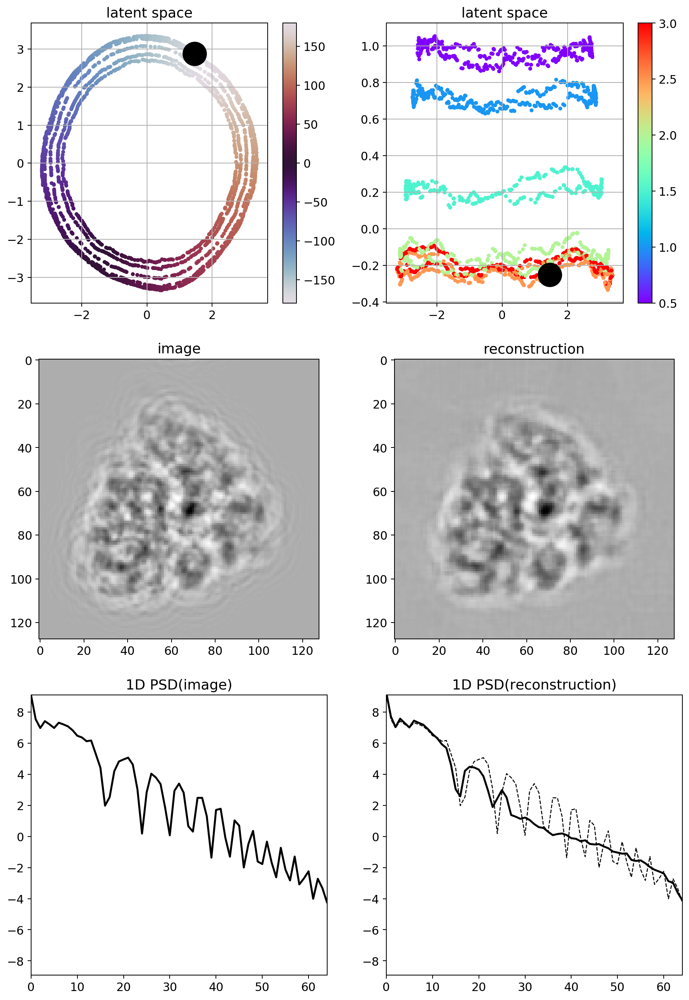

43


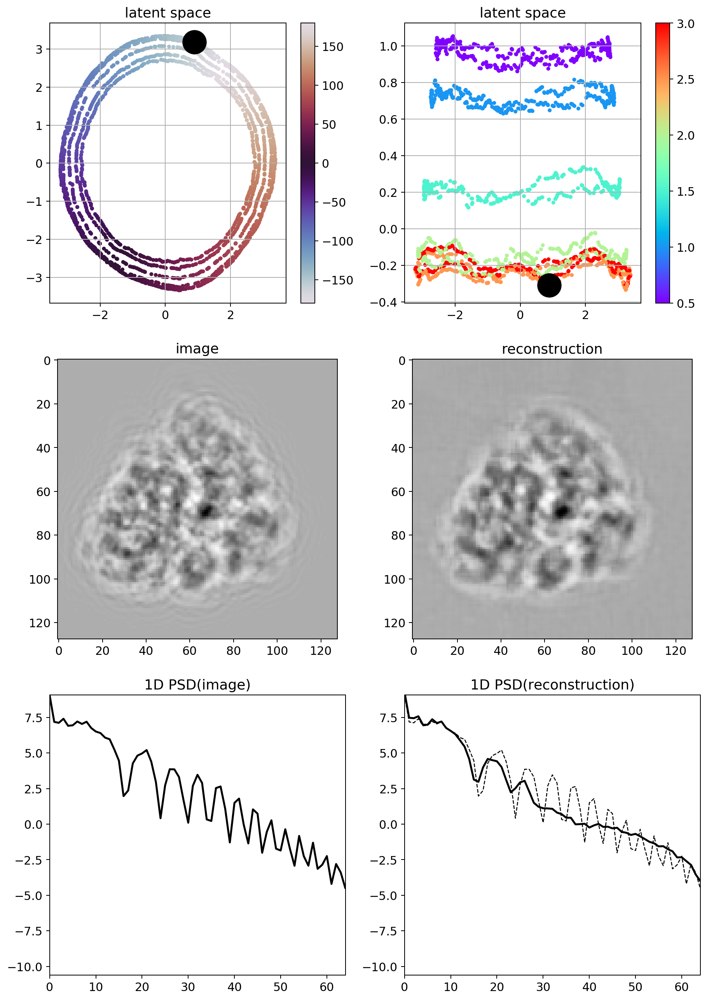

33


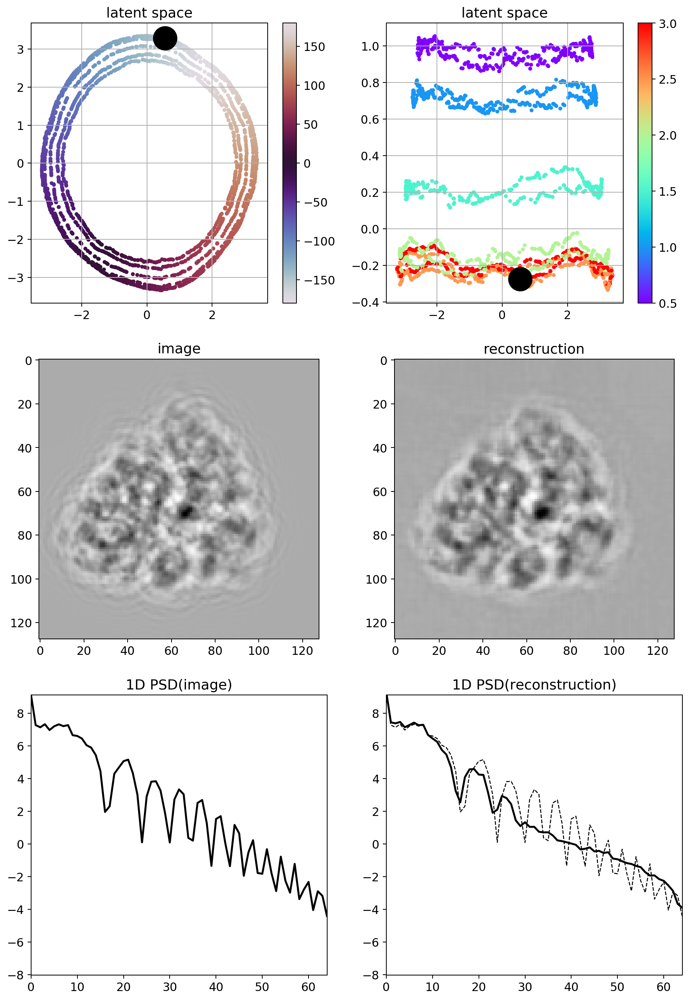

3


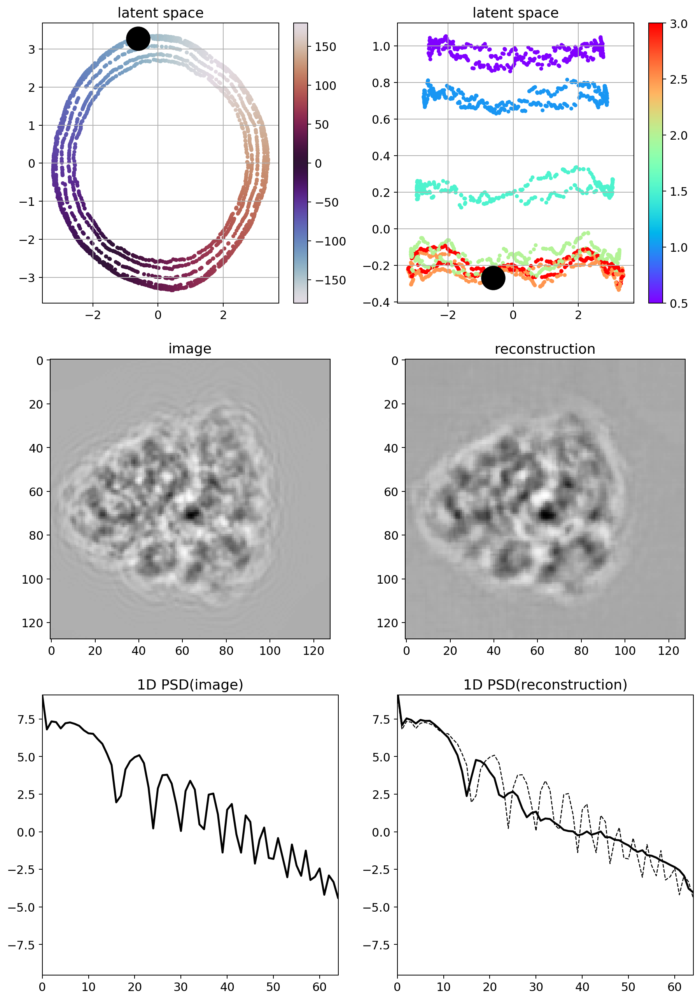

347


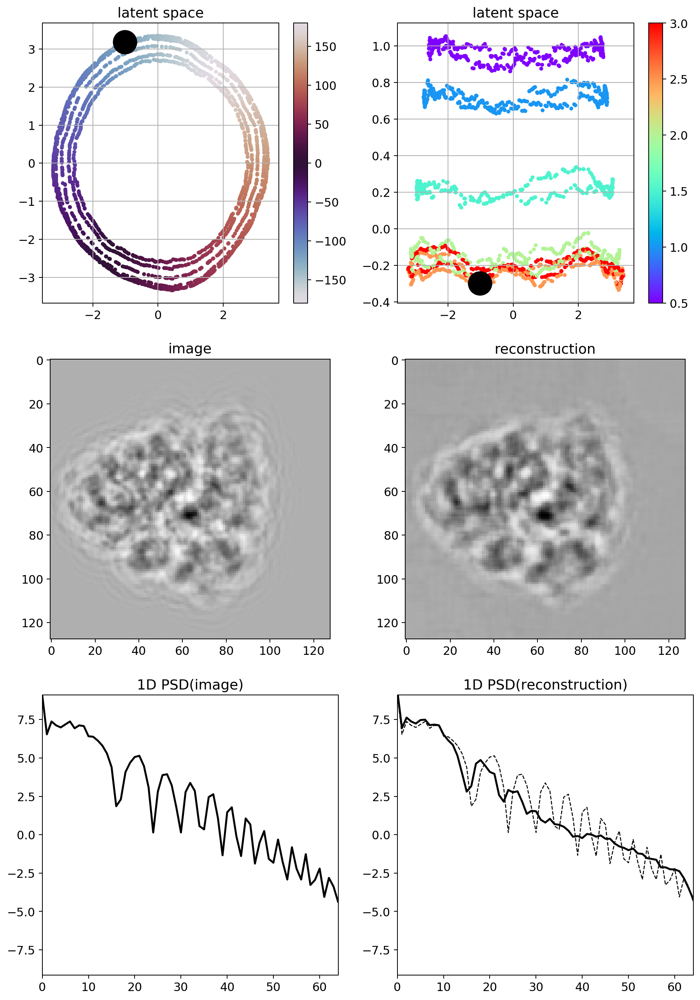

365


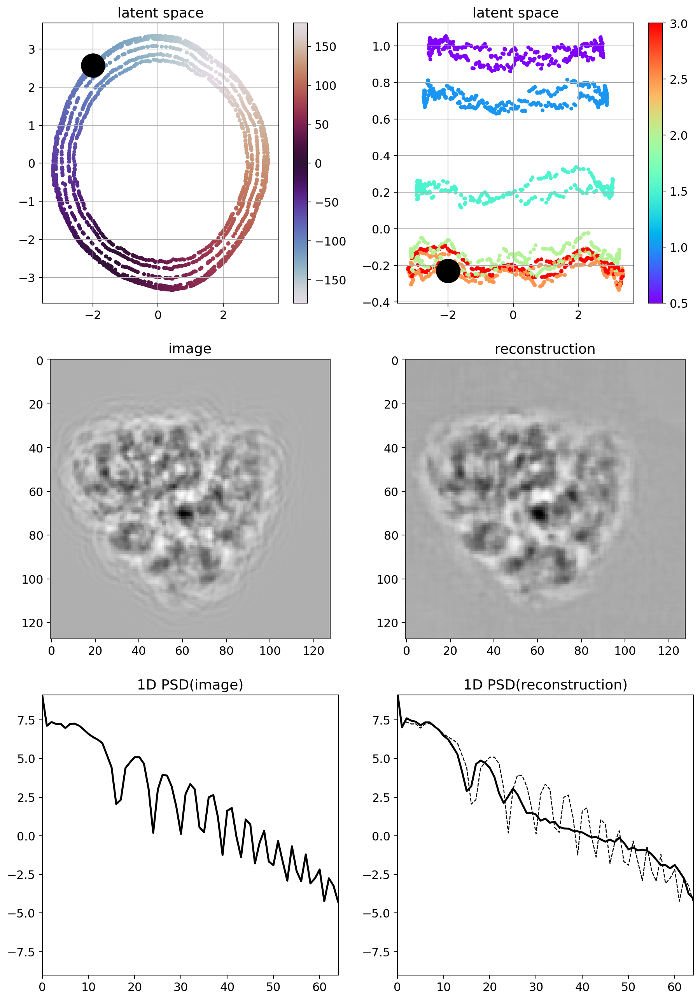

341


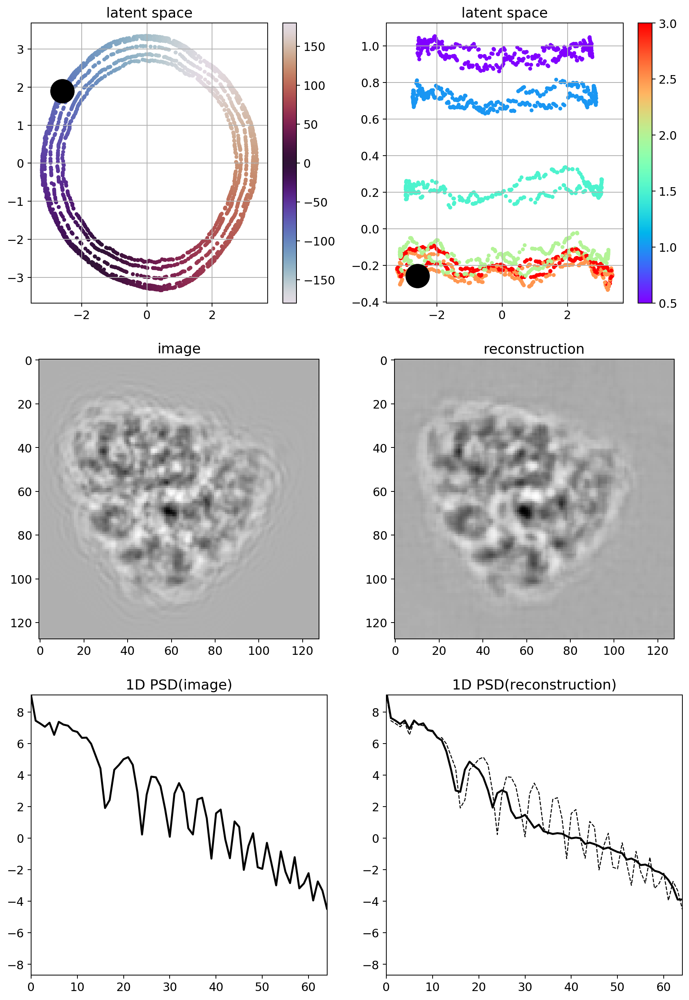

25


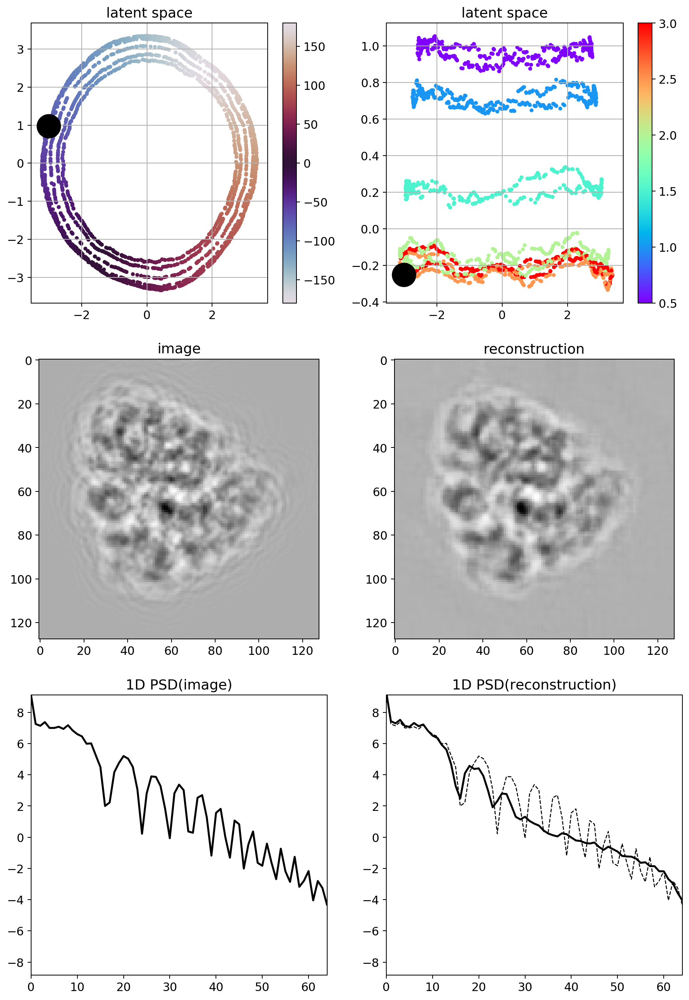

337


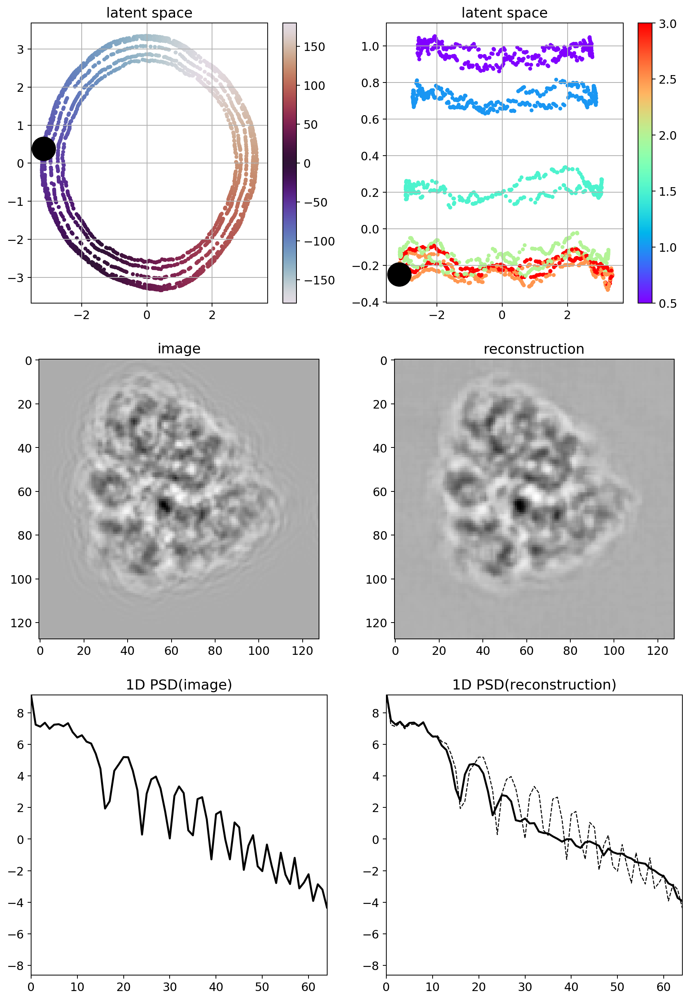

357


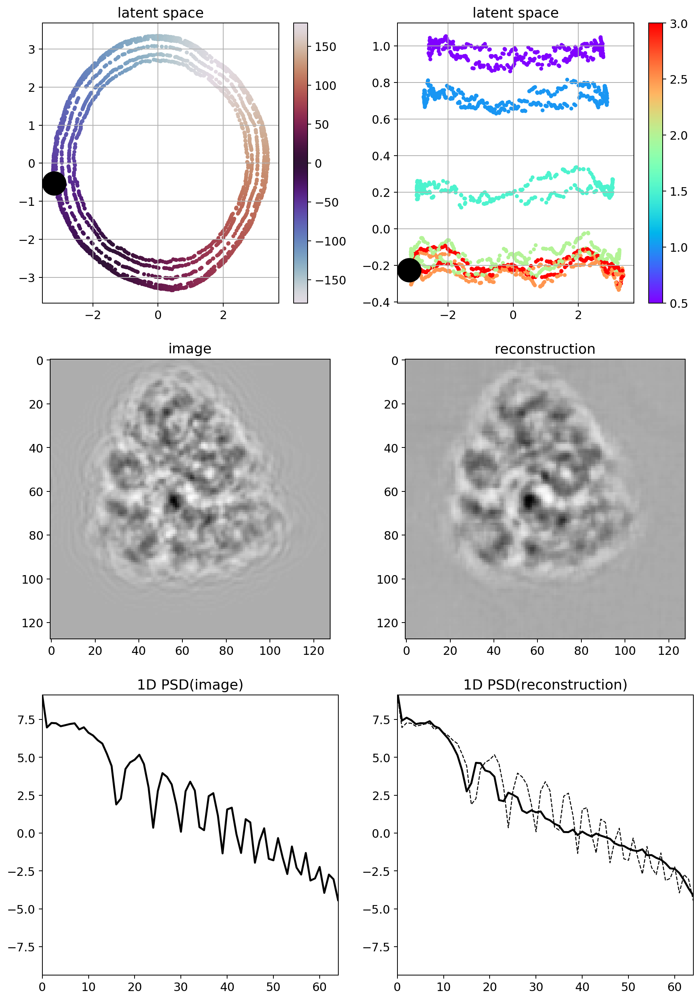

346


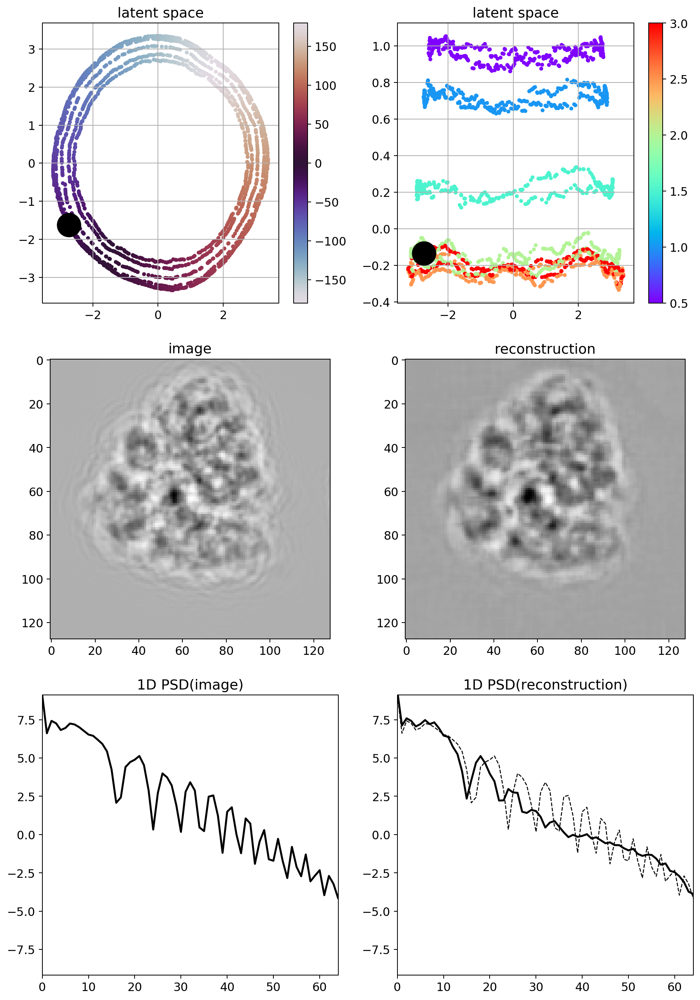

370


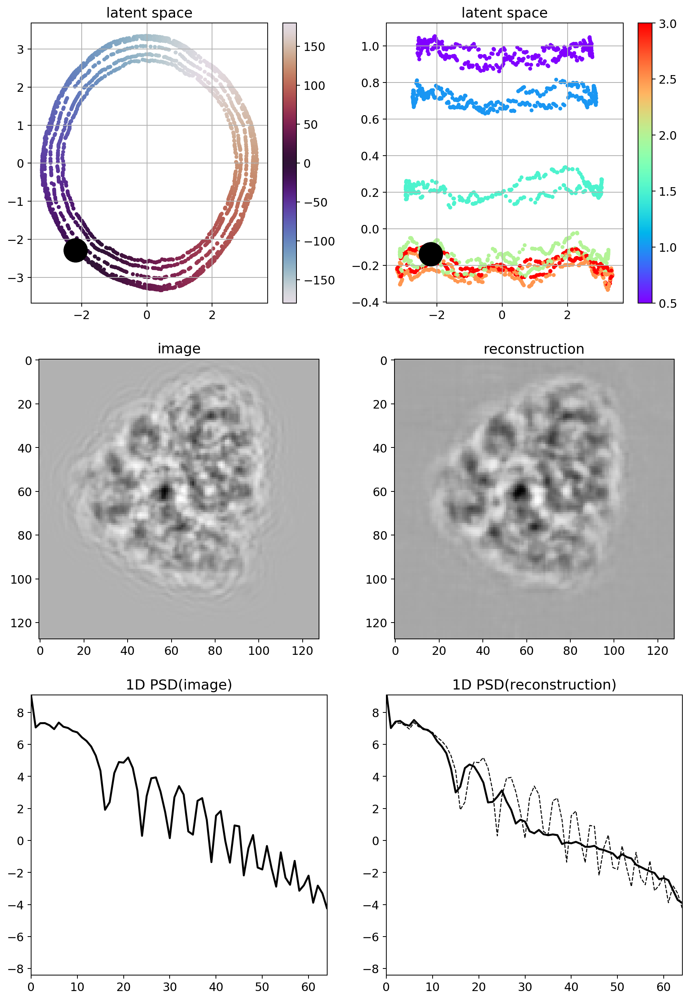

360


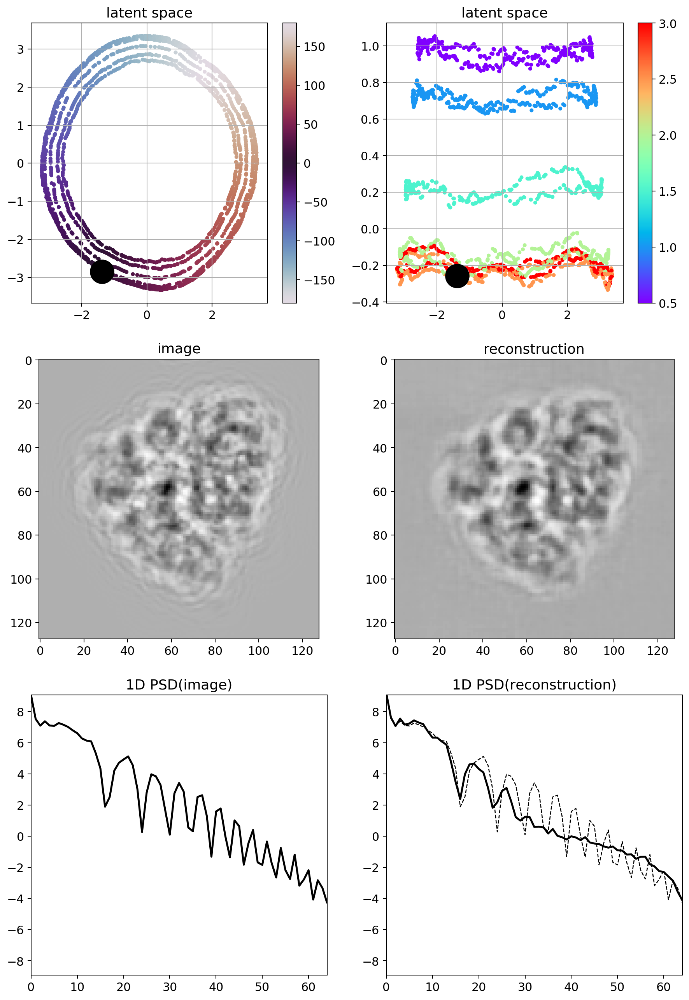

4


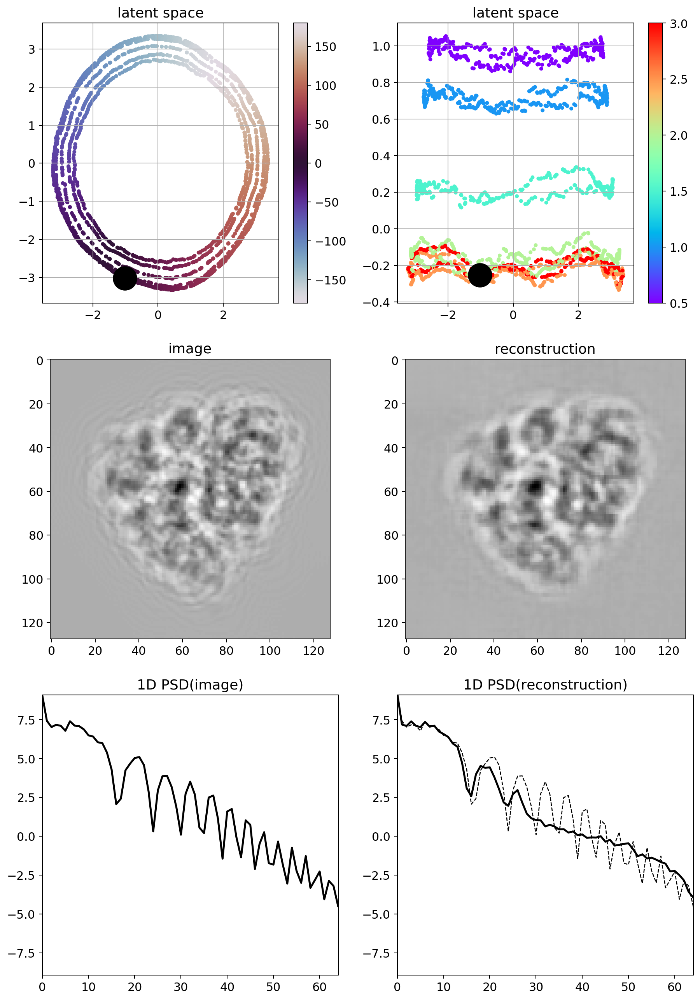

351


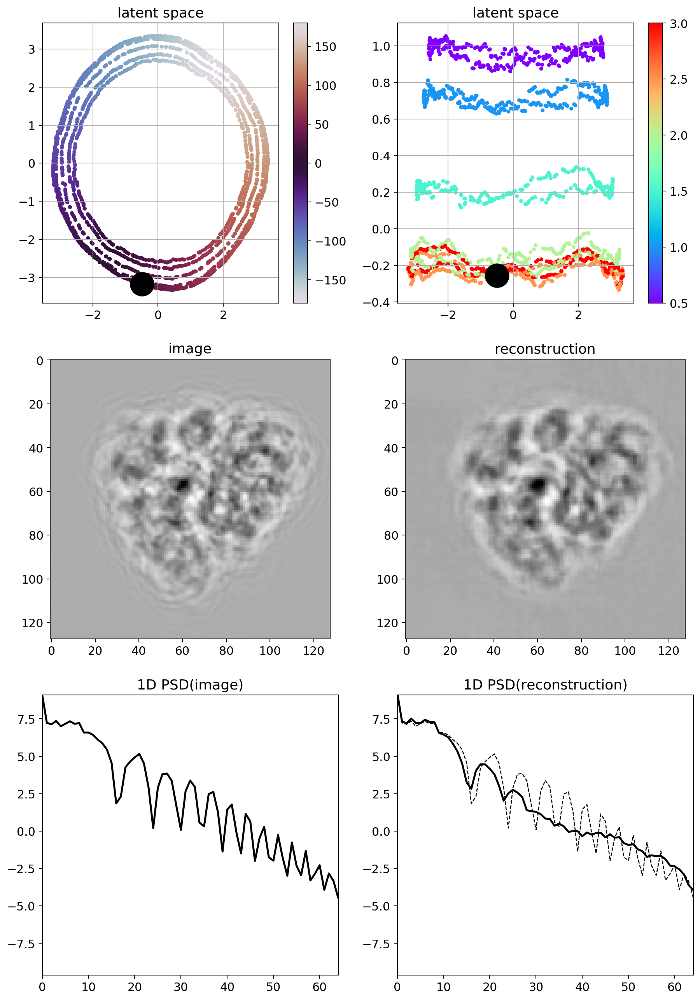

383


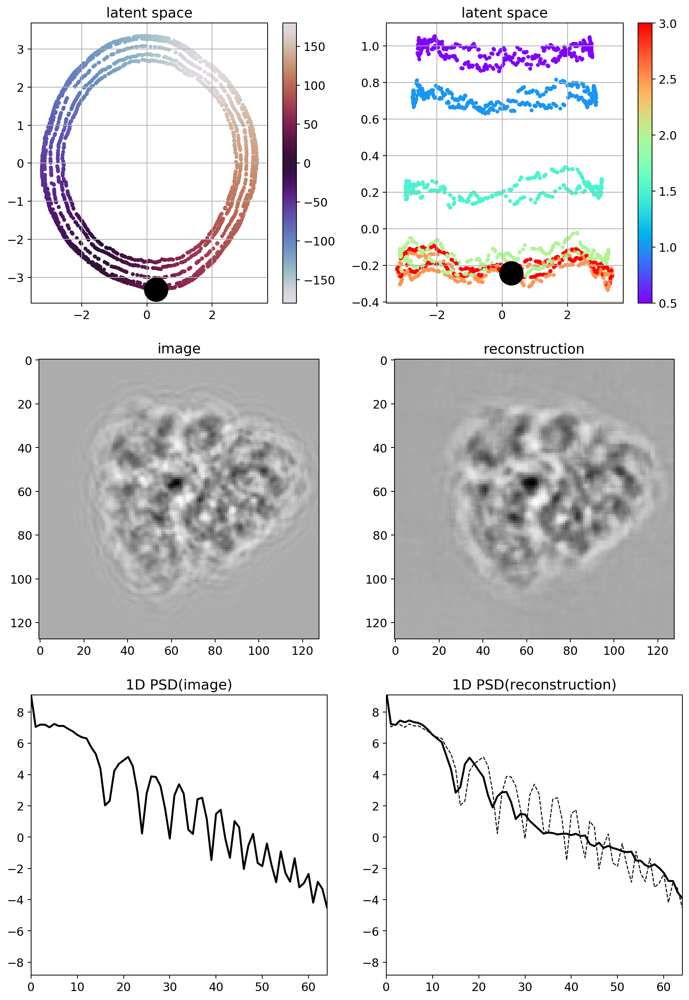

36


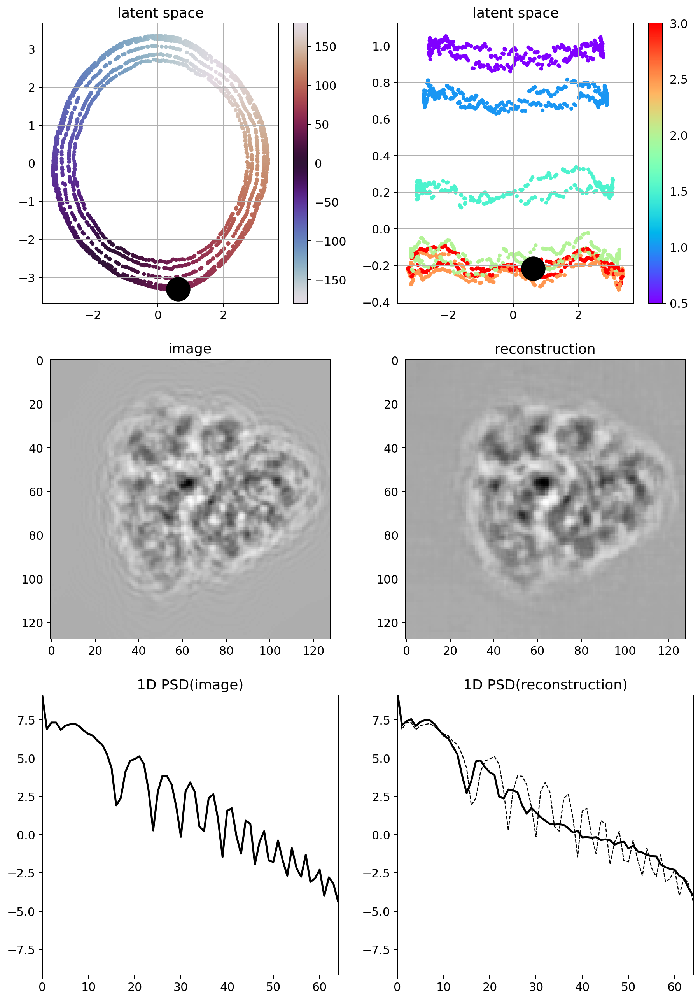

353


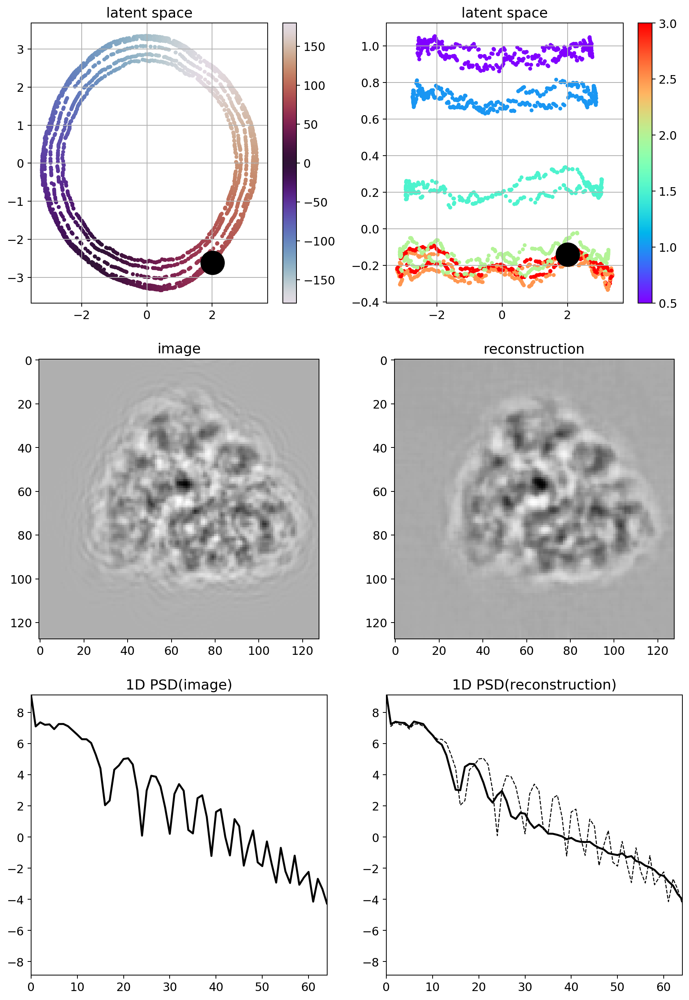

350


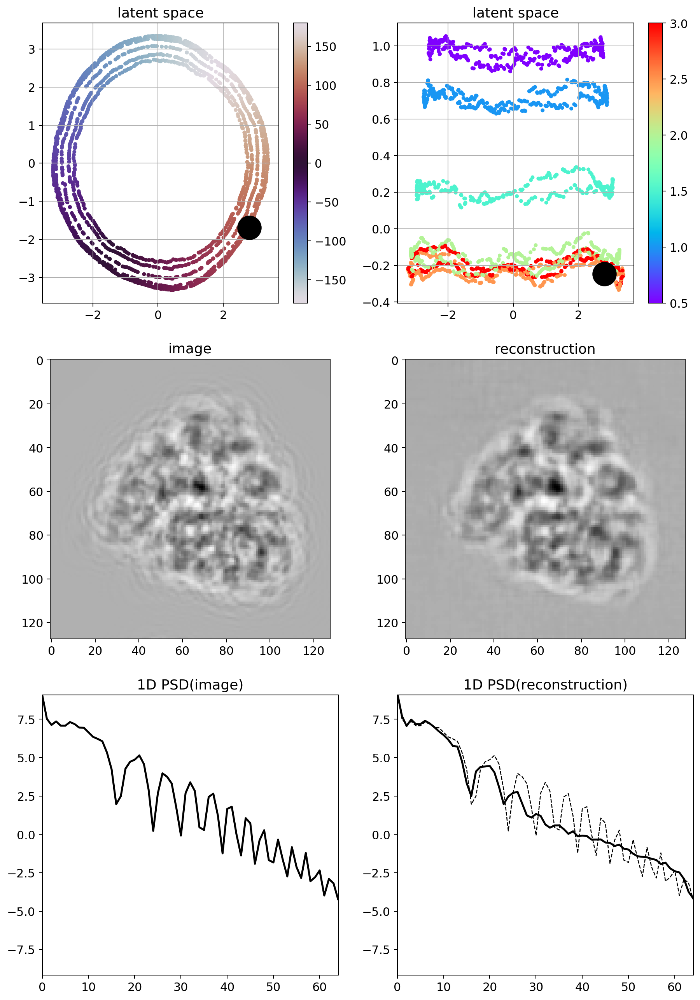

381


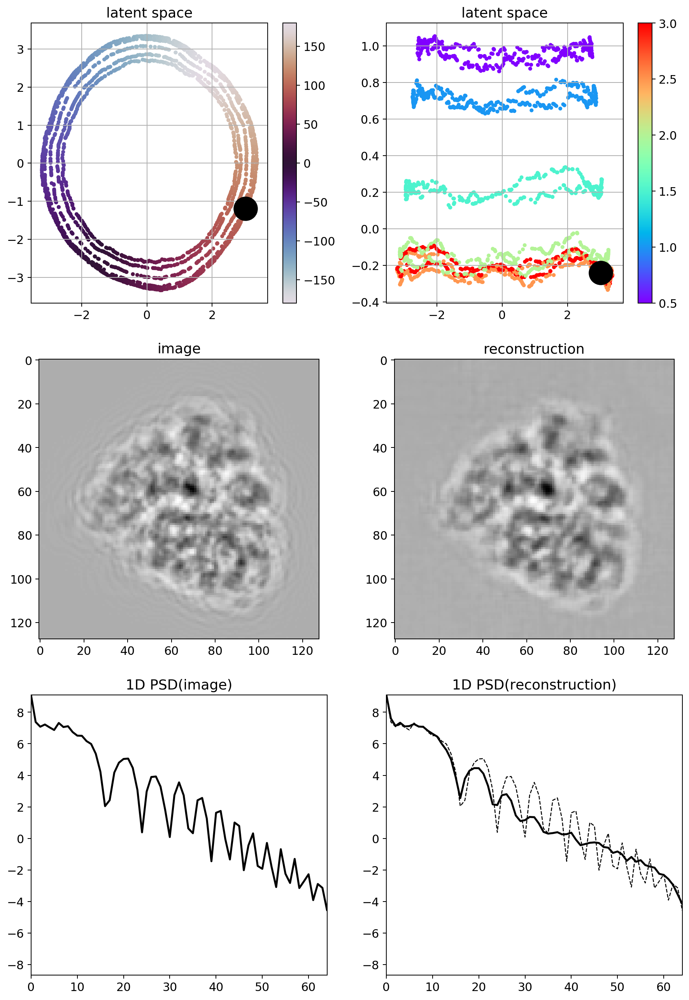

35


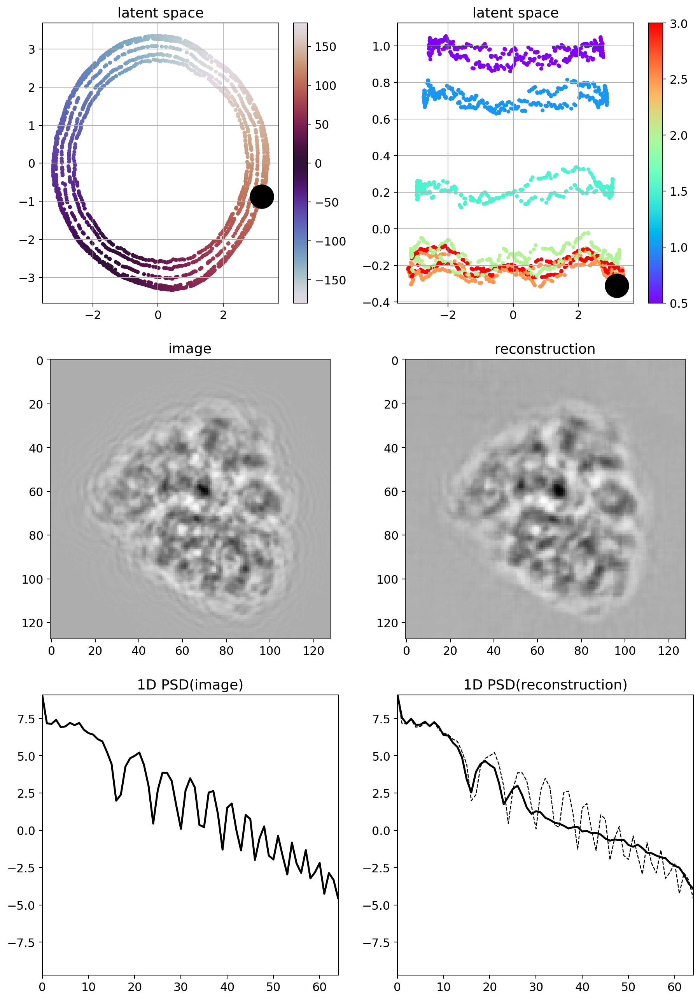

28


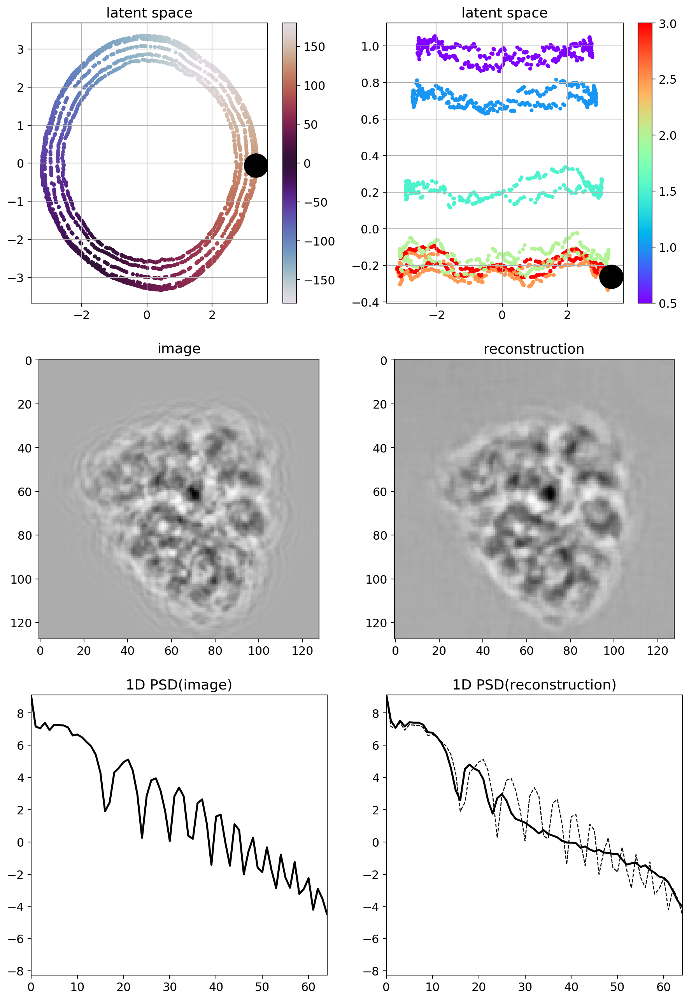

17


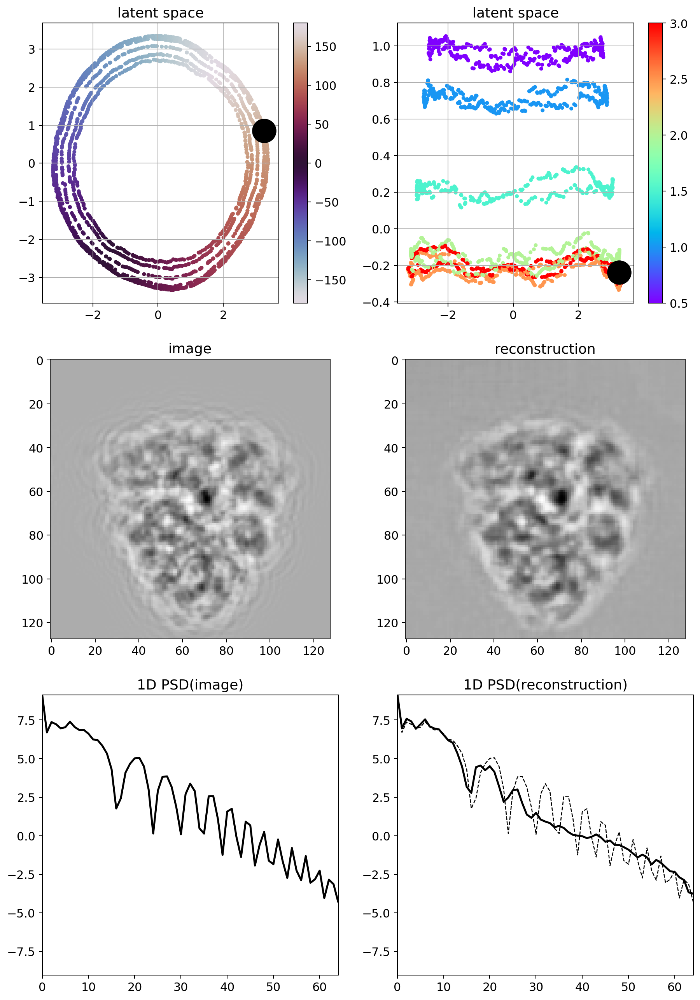

11


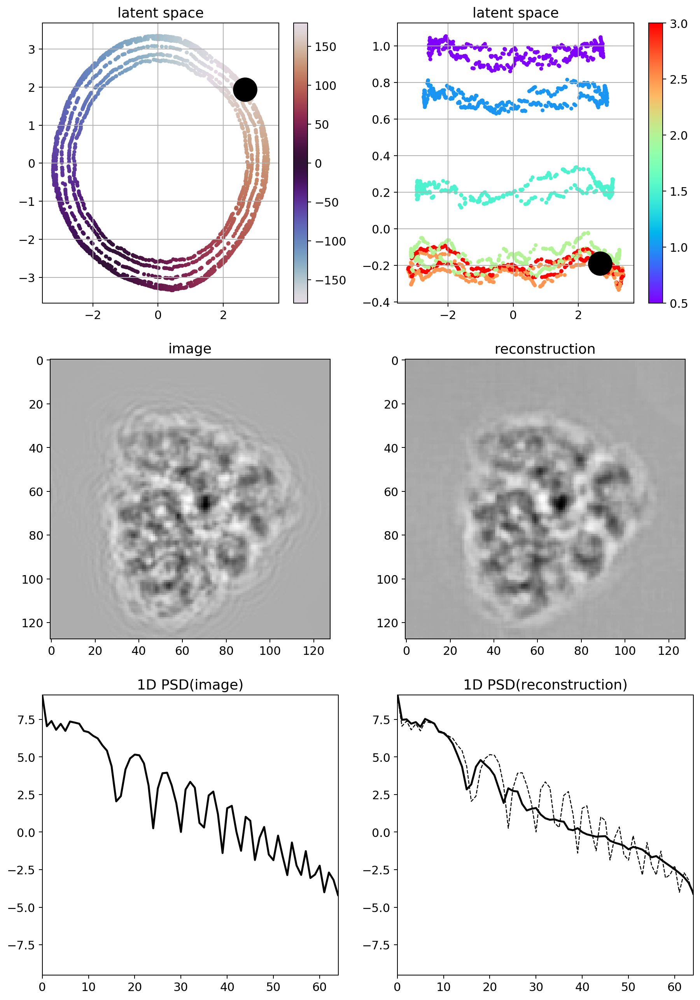

In [19]:
i=0
for iframe in pick_index[pick_index_sorted][::4]:
    i+=1
    print(iframe)
    viz.visualize(dataset, recon,
                  mus[:,0:2], mus[:,0:3:2],
                  metadata[:,1], metadata[:,0],
                  cmap1='twilight', cmap2='rainbow',
                  iframe=iframe,
                  show_3dpsd=False, show_1dpsd=True,
                  figname=KEYWORD+'/series_'+SERIES_NAME+'/data{:07d}_frame{:03d}.png'.format(iframe,i))